In [0]:
# To import mlflow and autolog machine learning runs
import mlflow
mlflow.pyspark.ml.autolog()

In [0]:
# The FaultDataset in DBFS
dbutils.fs.ls("/FileStore/tables/")

Out[2]: [FileInfo(path='dbfs:/FileStore/tables/FaultDataset.csv', name='FaultDataset.csv', size=1703184, modificationTime=1678589742000),
 FileInfo(path='dbfs:/FileStore/tables/Occupancy_Detection_Data.csv', name='Occupancy_Detection_Data.csv', size=50968, modificationTime=1677673883000),
 FileInfo(path='dbfs:/FileStore/tables/account-models/', name='account-models/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/FileStore/tables/accounts/', name='accounts/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/FileStore/tables/accounts.zip', name='accounts.zip', size=5297592, modificationTime=1675260543000),
 FileInfo(path='dbfs:/FileStore/tables/activations/', name='activations/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/FileStore/tables/activations.zip', name='activations.zip', size=8411369, modificationTime=1675257654000),
 FileInfo(path='dbfs:/FileStore/tables/clinicaltrial_2019/', name='clinicaltrial_2019/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/FileStor

In [0]:
# To read the data we want to work with into spark DataFrame
FaultsDF = spark.read.csv("/FileStore/tables/FaultDataset.csv",
                         header = "true",
                         inferSchema = "true")

In [0]:
# To have an overview of what the data looks like
FaultsDF.display()

1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected
0.3503125,0.3496875,0.35,0.3459375,0.3475,0.3459375,0.341875,0.3434375,0.355,0.3553125,0.3459375,0.3525,0.3575,0.3590625,0.35875,0.3484375,0.3590625,0.35,0.3559375,0.3490625,0
0.5090625,0.484375,0.046875,0.071875,0.06,0.0634375,0.0575,0.0546875,0.0559375,0.058125,0.0628125,0.065625,0.0640625,0.0634375,0.0534375,0.084375,0.0615625,0.05375,0.076875,0.056875,0
0.0928125,0.0975,0.1096875,0.1025,0.09625,0.1053125,0.09875,0.098125,0.091875,0.0909375,0.09875,0.103125,0.1,0.1034375,0.1015625,0.0978125,0.0990625,0.10375,0.098125,0.1040625,0
0.09375,0.089375,0.091875,0.0996875,0.0909375,0.096875,0.0940625,0.096875,0.096875,0.099375,0.099375,0.0959375,0.0959375,0.0940625,0.09125,0.0996875,0.09375,0.0934375,0.0971875,0.094375,0
0.036875,0.0440625,0.038125,0.0428125,0.0353125,0.0340625,0.033125,0.0403125,0.0346875,0.036875,0.035625,0.03625,0.0409375,0.039375,0.035,0.040625,0.0384375,0.036875,0.04,0.0371875,0
0.135625,0.3034375,0.13875,0.140625,0.126875,0.130625,0.139375,0.143125,0.1290625,0.140625,0.1340625,0.1396875,0.1384375,0.1453125,0.1453125,0.1496875,0.1440625,0.1359375,0.1453125,0.14625,0
0.3446875,0.35125,0.3353125,0.3471875,0.34625,0.348125,0.3478125,0.3521875,0.3525,0.35125,0.3571875,0.360625,0.3640625,0.36625,0.3640625,0.3634375,0.3475,0.35375,0.1575,0.351875,0
0.036875,0.035625,0.03125,0.0375,0.0390625,0.034375,0.0315625,0.031875,0.0378125,0.0321875,0.0371875,0.038125,0.035,0.0353125,0.0325,0.03,0.0325,0.0321875,0.0321875,0.03125,0
0.0371875,0.039375,0.033125,0.04,0.04125,0.03875,0.035625,0.0384375,0.0378125,0.0365625,0.033125,0.0365625,0.03375,0.034375,0.0346875,0.04125,0.0365625,0.035,0.034375,0.0396875,0
0.3590625,0.3609375,0.360625,0.3590625,0.355,0.365,0.355625,0.358125,0.3575,0.3578125,0.355625,0.3584375,0.3521875,0.3459375,0.3521875,0.3509375,0.3525,0.35625,0.353125,0.3540625,0


In [0]:
#To convert to pandas dataframe so that we can perform some EDA and visualisations
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [0]:
# To convert FaultsDF To pandas dataframe
FaultPandasFrame = FaultsDF.toPandas()

In [0]:
# To see the first five rows in the data
FaultPandasFrame.head()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected
0,0.350313,0.349687,0.350000,0.345938,0.347500,0.345938,0.341875,0.343438,0.355000,0.355312,0.345938,0.352500,0.357500,0.359063,0.358750,0.348438,0.359063,0.350000,0.355938,0.349062,0
1,0.509062,0.484375,0.046875,0.071875,0.060000,0.063437,0.057500,0.054688,0.055938,0.058125,0.062812,0.065625,0.064062,0.063437,0.053437,0.084375,0.061562,0.053750,0.076875,0.056875,0
2,0.092813,0.097500,0.109687,0.102500,0.096250,0.105313,0.098750,0.098125,0.091875,0.090938,0.098750,0.103125,0.100000,0.103438,0.101562,0.097812,0.099062,0.103750,0.098125,0.104063,0
3,0.093750,0.089375,0.091875,0.099687,0.090938,0.096875,0.094062,0.096875,0.096875,0.099375,0.099375,0.095937,0.095937,0.094062,0.091250,0.099687,0.093750,0.093438,0.097187,0.094375,0
4,0.036875,0.044062,0.038125,0.042813,0.035312,0.034063,0.033125,0.040313,0.034688,0.036875,0.035625,0.036250,0.040938,0.039375,0.035000,0.040625,0.038437,0.036875,0.040000,0.037187,0


Out[8]: <AxesSubplot:xlabel='fault_detected', ylabel='Count'>

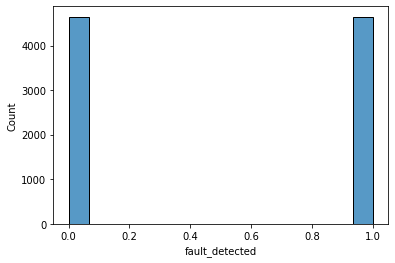

In [0]:
# To see the class balance using a histogram plot.
# The result shows that we have a balance class between fault detected or not
sns.histplot(FaultPandasFrame, x ='fault_detected')

In [0]:
FaultPandasFrame.shape

Out[9]: (9292, 21)

In [0]:
# To get a summary of the data
FaultPandasFrame.describe()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected
count,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000
mean,0.341623,0.342631,0.342121,0.342139,0.342843,0.342828,0.342715,0.343066,0.343173,0.343925,0.344108,0.343984,0.344118,0.344879,0.344900,0.345834,0.345635,0.345753,0.346522,0.346671,0.500000
std,0.289195,0.289088,0.289164,0.289164,0.288965,0.289089,0.289195,0.289192,0.289340,0.289012,0.289200,0.289071,0.289118,0.288982,0.289131,0.288829,0.288920,0.289150,0.288771,0.289001,0.500027
min,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.025000,0.025000,0.025000,0.024375,0.024375,0.024375,0.024375,0.025000,0.000000
25%,0.064062,0.064609,0.064375,0.064375,0.065000,0.065000,0.064687,0.065312,0.065000,0.065937,0.066172,0.066250,0.066562,0.066875,0.067422,0.067812,0.067500,0.067187,0.068750,0.068672,0.000000
50%,0.342187,0.343750,0.342813,0.342031,0.343594,0.343750,0.342813,0.343125,0.342813,0.345000,0.345313,0.345000,0.344062,0.345781,0.345313,0.346406,0.346562,0.346562,0.345938,0.346562,0.500000
75%,0.618437,0.619062,0.619062,0.619062,0.619062,0.619062,0.619141,0.619687,0.619766,0.620000,0.620313,0.620313,0.620625,0.620625,0.620938,0.621250,0.621250,0.621563,0.621875,0.622266,1.000000
max,1.080938,1.213437,1.080938,1.080938,1.080938,1.080938,1.080938,1.080938,1.080938,1.080938,1.080938,1.213437,1.080938,1.213437,1.080938,1.080938,1.080938,1.080938,1.080938,1.080938,1.000000


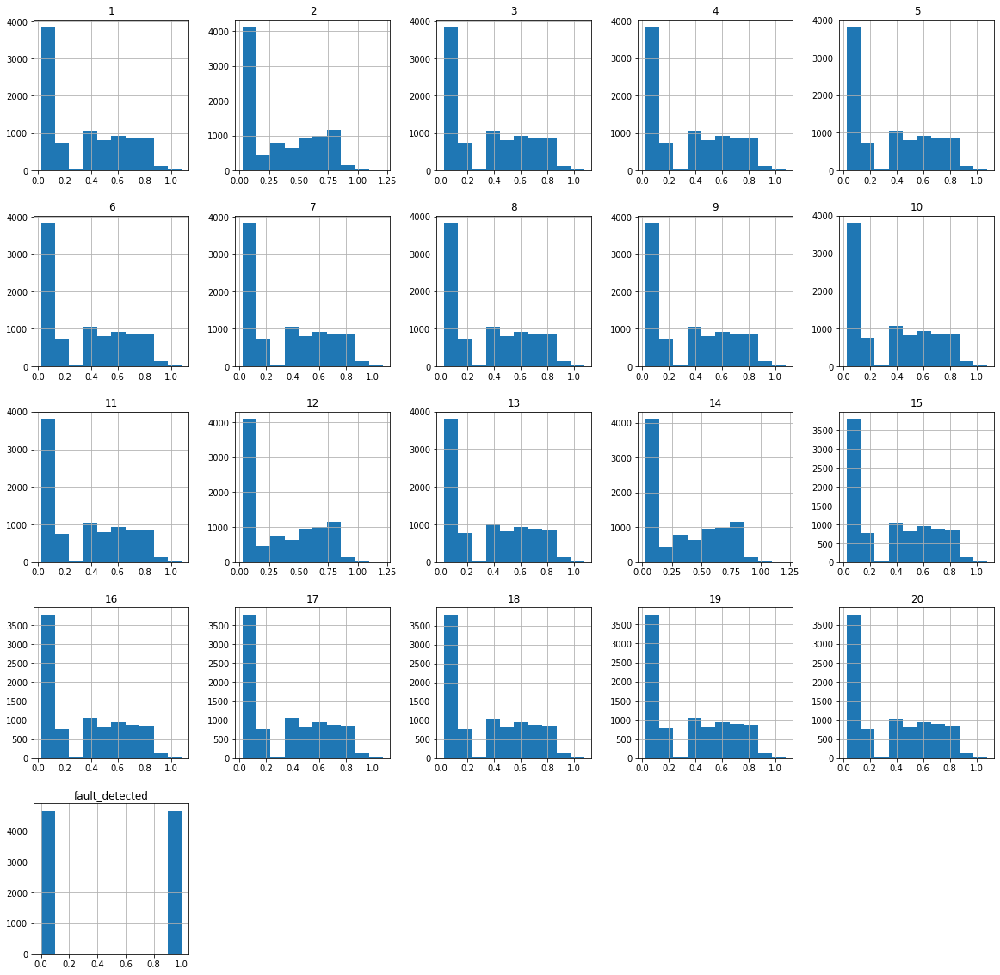

In [0]:
#Histogram plot of the various features in the data to see how the vibration sensor readings from the data are distributed.
FaultPandasFrame.hist()
plt.gcf().set_size_inches(20,20)
plt.show()

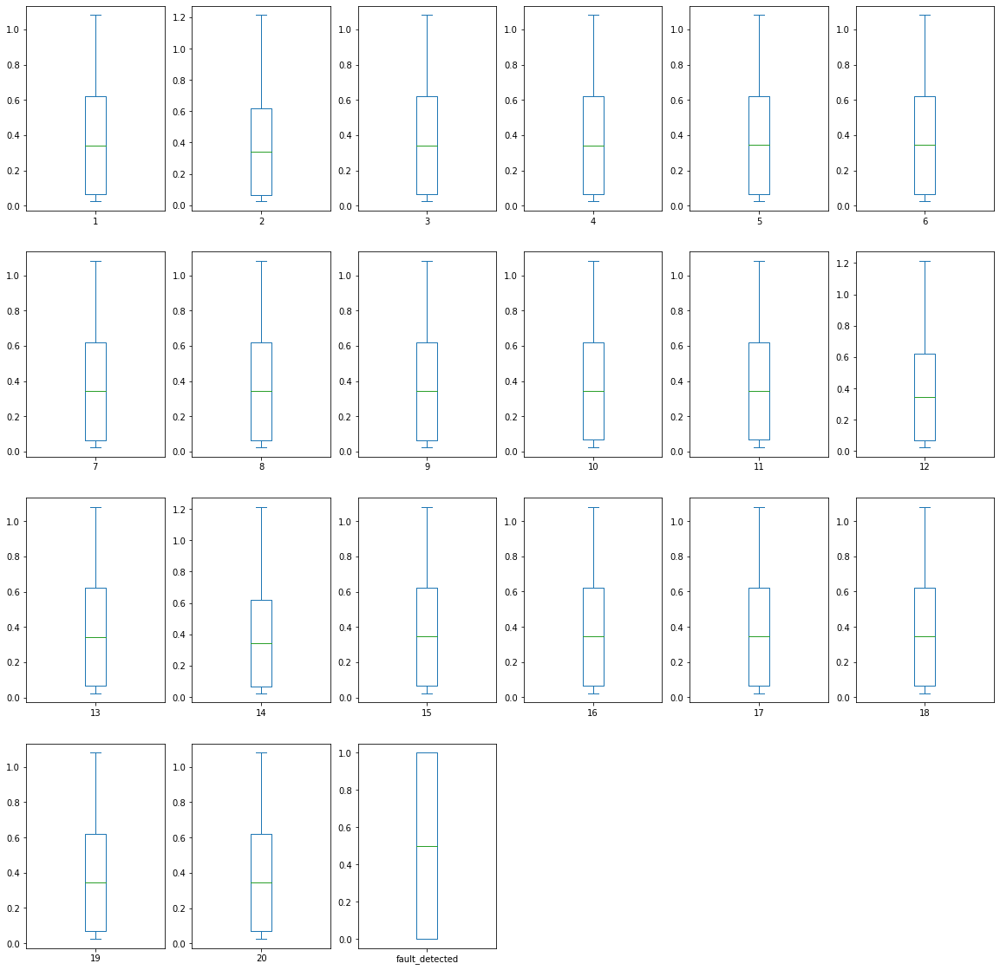

In [0]:
# Using a box and whisker plot to check if there are outliers in the virbration readings
FaultPandasFrame.plot(kind='box', subplots=True, layout=(4,6))
plt.gcf().set_size_inches(20,20)
plt.show()

In [0]:
FaultPandasFrame.corr()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected
1,1.000000,0.843847,0.815780,0.826661,0.819727,0.806820,0.800609,0.800667,0.785560,0.781098,0.781228,0.772658,0.773191,0.778808,0.770734,0.758679,0.765337,0.757268,0.752535,0.751781,0.667028
2,0.843847,1.000000,0.843153,0.813794,0.824917,0.818478,0.806115,0.799769,0.798175,0.785856,0.778867,0.780272,0.771881,0.772782,0.777026,0.769570,0.757522,0.764096,0.758217,0.751194,0.666130
3,0.815780,0.843153,1.000000,0.844225,0.815464,0.826045,0.818762,0.806707,0.799662,0.801067,0.785955,0.780895,0.780712,0.774265,0.772514,0.777459,0.770544,0.759063,0.766772,0.757990,0.668463
4,0.826661,0.813794,0.844225,1.000000,0.844152,0.815404,0.825898,0.821163,0.807515,0.801069,0.799968,0.786714,0.783222,0.783219,0.774887,0.774451,0.780225,0.771988,0.761376,0.766829,0.670146
5,0.819727,0.824917,0.815464,0.844152,1.000000,0.843323,0.814768,0.827324,0.820063,0.807351,0.800829,0.801012,0.786438,0.783206,0.782338,0.774300,0.775226,0.779908,0.772765,0.760875,0.669696
6,0.806820,0.818478,0.826045,0.815404,0.843323,1.000000,0.842480,0.813768,0.824977,0.821148,0.807483,0.799901,0.800890,0.787682,0.782074,0.781673,0.775094,0.774694,0.780398,0.771479,0.669190
7,0.800609,0.806115,0.818762,0.825898,0.814768,0.842480,1.000000,0.844601,0.814972,0.826524,0.819826,0.807104,0.801846,0.802103,0.788105,0.782957,0.783322,0.775707,0.776955,0.780377,0.671794
8,0.800667,0.799769,0.806707,0.821163,0.827324,0.813768,0.844601,1.000000,0.843669,0.813676,0.824552,0.819180,0.807114,0.801997,0.800667,0.788960,0.782572,0.783127,0.777520,0.776530,0.673588
9,0.785560,0.798175,0.799662,0.807515,0.820063,0.824977,0.814972,0.843669,1.000000,0.843174,0.813524,0.825630,0.820179,0.807529,0.801262,0.801438,0.789297,0.782368,0.784443,0.776484,0.674972
10,0.781098,0.785856,0.801067,0.801069,0.807351,0.821148,0.826524,0.813676,0.843174,1.000000,0.842913,0.812985,0.825341,0.819571,0.807342,0.801288,0.801063,0.788638,0.782847,0.783898,0.675330


Out[14]: <AxesSubplot:>

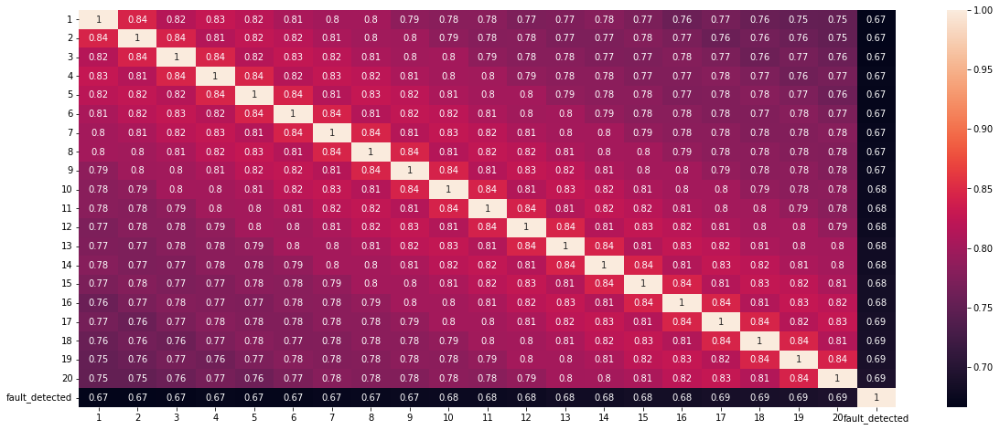

In [0]:
# Correlation matrix of the readings from the vibration sensors  and the fault detection
data = FaultPandasFrame
plt.figure(figsize=(20,8))
sns.heatmap(data.corr(), annot = True)

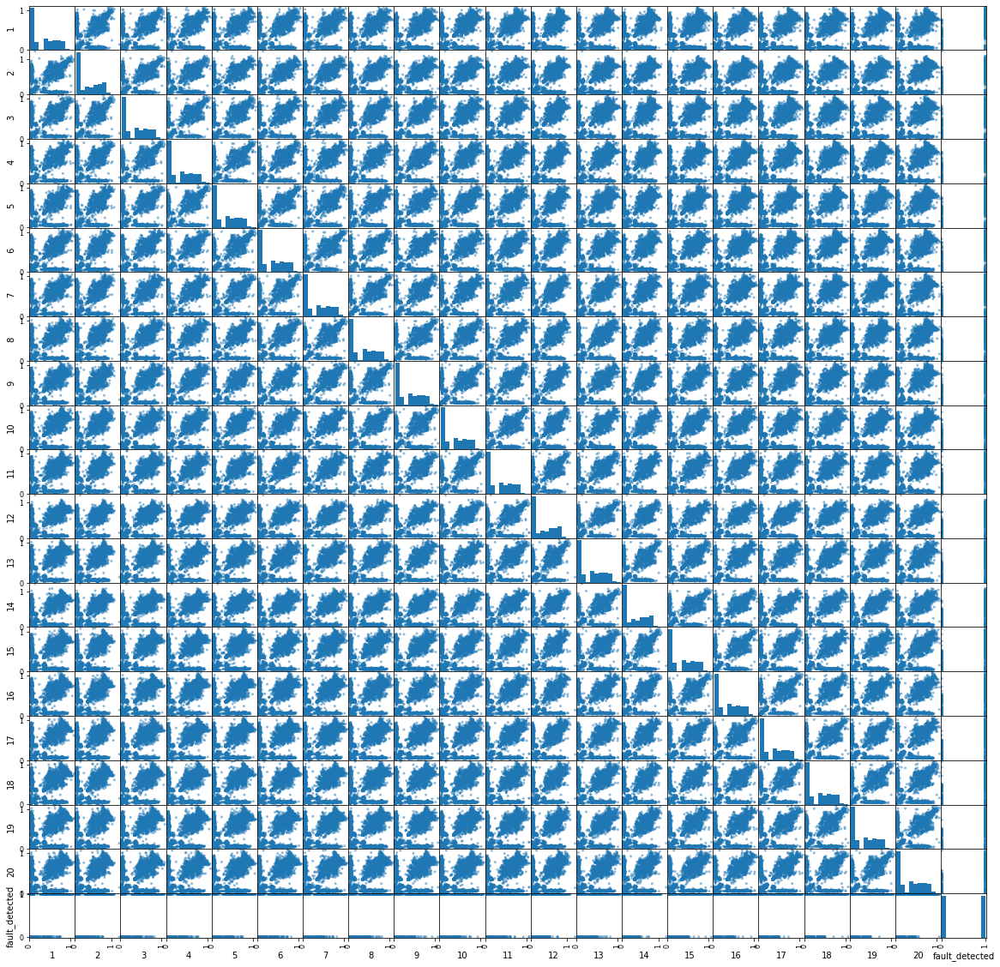

In [0]:
#Scatter plot matrix to show the realtionship between two variables of the parameters being read by the vibration sensor
from pandas.plotting import scatter_matrix
scatter_matrix(FaultPandasFrame)
plt.gcf().set_size_inches(20,20)
plt.show()

In [0]:
df2 = FaultPandasFrame


In [0]:
#import pandas as pd

In [0]:
# We want to visualise the fault detection based on the vibration readings from each features
# To get a better visualisation, the vibration readings will be put into bins such that we capture from the minimum reading and the maximum reading
# First we can introduce a variable to hold the pandas dataframe create earlier
df = FaultPandasFrame


In [0]:
df.describe()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected
count,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000
mean,0.341623,0.342631,0.342121,0.342139,0.342843,0.342828,0.342715,0.343066,0.343173,0.343925,0.344108,0.343984,0.344118,0.344879,0.344900,0.345834,0.345635,0.345753,0.346522,0.346671,0.500000
std,0.289195,0.289088,0.289164,0.289164,0.288965,0.289089,0.289195,0.289192,0.289340,0.289012,0.289200,0.289071,0.289118,0.288982,0.289131,0.288829,0.288920,0.289150,0.288771,0.289001,0.500027
min,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.025000,0.025000,0.025000,0.024375,0.024375,0.024375,0.024375,0.025000,0.000000
25%,0.064062,0.064609,0.064375,0.064375,0.065000,0.065000,0.064687,0.065312,0.065000,0.065937,0.066172,0.066250,0.066562,0.066875,0.067422,0.067812,0.067500,0.067187,0.068750,0.068672,0.000000
50%,0.342187,0.343750,0.342813,0.342031,0.343594,0.343750,0.342813,0.343125,0.342813,0.345000,0.345313,0.345000,0.344062,0.345781,0.345313,0.346406,0.346562,0.346562,0.345938,0.346562,0.500000
75%,0.618437,0.619062,0.619062,0.619062,0.619062,0.619062,0.619141,0.619687,0.619766,0.620000,0.620313,0.620313,0.620625,0.620625,0.620938,0.621250,0.621250,0.621563,0.621875,0.622266,1.000000
max,1.080938,1.213437,1.080938,1.080938,1.080938,1.080938,1.080938,1.080938,1.080938,1.080938,1.080938,1.213437,1.080938,1.213437,1.080938,1.080938,1.080938,1.080938,1.080938,1.080938,1.000000


Out[20]: Text(0.5, 0, 'vibration readings from sensor')

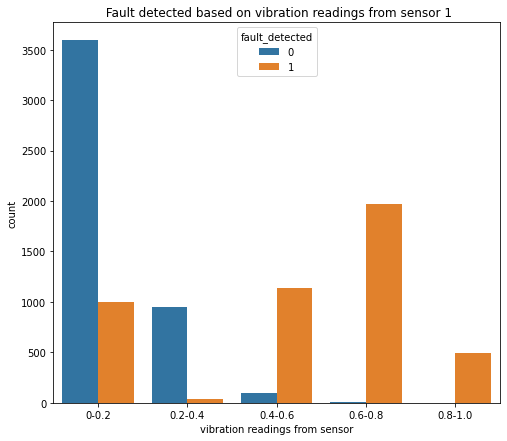

In [0]:
# Putting sensor readings into bins
bin_sensor_1 = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
labels =['0-0.2', '0.2-0.4', '0.4-0.6', '0.6-0.8', '0.8-1.0']
df['binned_1'] = pd.cut(df['1'], bins=bin_sensor_1 , labels =labels)
plt.figure(figsize=(8,7))
sns.countplot(x='binned_1',hue='fault_detected',  data = df)
plt.title(" Fault detected based on vibration readings from sensor 1", fontsize = 12)
plt.xlabel('vibration readings from sensor')

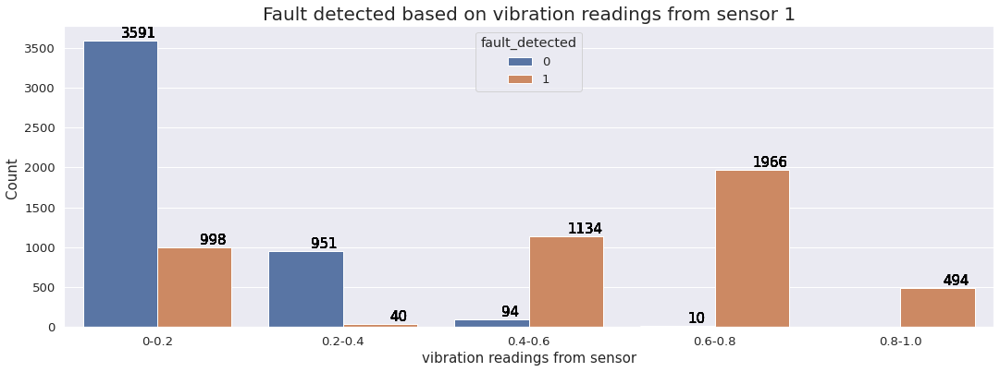

In [0]:
plt.figure(figsize=(18,6))
sns.set(font_scale=1.2)
ax=sns.countplot(x='binned_1',hue='fault_detected',  data = df)
ax.set_title('Fault detected based on vibration readings from sensor 1' , fontsize = 20)
plt.xlabel('vibration readings from sensor', fontsize=15)
plt.ylabel('Count ', fontsize=15)
plt.xticks(rotation='horizontal')
for p in ax.patches:
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'),
                    (p.get_x()+0.3, p.get_height()), ha='center', va='bottom', color='black', size=15)

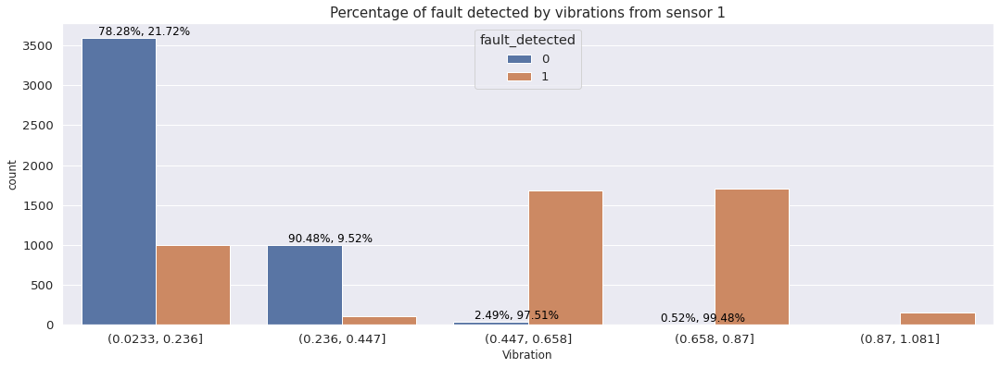

In [0]:
# Cut vibration readings inti bin and show the percenatge of fault detected within each bin
bin_sen_1 = pd.cut(df['1'], bins=5, ordered=True)
sen1_labels = [f'({interval.left}, {interval.right}]' for interval in bin_sen_1.cat.categories]
df['bins_sen_1'] = bin_sen_1.cat.rename_categories(sen1_labels )

# Create countplot
plt.figure(figsize=(18, 6))
sns.set(font_scale=1.2)
ax = sns.countplot(x='bins_sen_1',hue='fault_detected', data= df)
ax.set_title('Percentage of fault detected by vibrations from sensor 1', fontsize=15)
plt.xlabel('Vibration', fontsize=12)
plt.ylabel('count', fontsize=12)
plt.xticks(rotation='horizontal')

# Annotate plot with percentages
total_counts = df.groupby('bins_sen_1')['fault_detected'].count().reset_index(name='count')
fault_counts = df.groupby(['bins_sen_1', 'fault_detected']).size().reset_index(name='fault_count')

for p, label in zip(ax.patches, ax.get_xticklabels()):
    height = p.get_height()
    bin_label = label.get_text()
    bin_counts = fault_counts[fault_counts['bins_sen_1'] == bin_label]['fault_count']
    total_count = total_counts[total_counts['bins_sen_1'] == bin_label]['count'].iloc[0]
    percentages = [count / total_count * 100 for count in bin_counts]
    percentage_str = ', '.join([f'{percentage:.2f}%' for percentage in percentages])
    ax.annotate(percentage_str, (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom', color='black', size=12,
                xytext=(28, 0), textcoords='offset points') 

plt.show()

Out[23]: Text(0.5, 0, 'vibration readings from sensor')

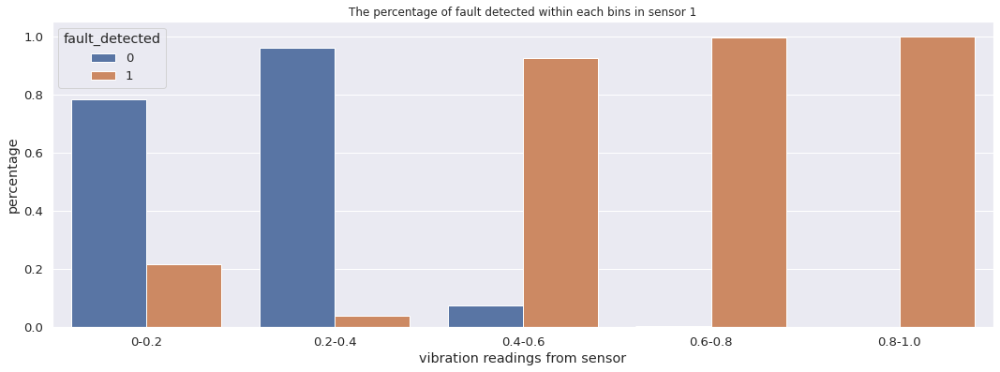

In [0]:
# The percentage of fault within each bins
bins = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
labels =['0-0.2', '0.2-0.4', '0.4-0.6', '0.6-0.8', '0.8-1.0']
df['binned'] = pd.cut(df['1'], bins=bins, labels =labels)

# group by binned and calculate percentage of each fault_detected
grouped = df.groupby('binned')['fault_detected'].value_counts(normalize=True).reset_index(name='percentage')
plt.figure(figsize=(18, 6))

sns.barplot(x='binned',y ='percentage', hue='fault_detected',  data = grouped)
plt.title("The percentage of fault detected within each bins in sensor 1", fontsize = 12)
plt.xlabel('vibration readings from sensor')

Out[24]: Text(0.5, 0, 'vibration readings from sensor')

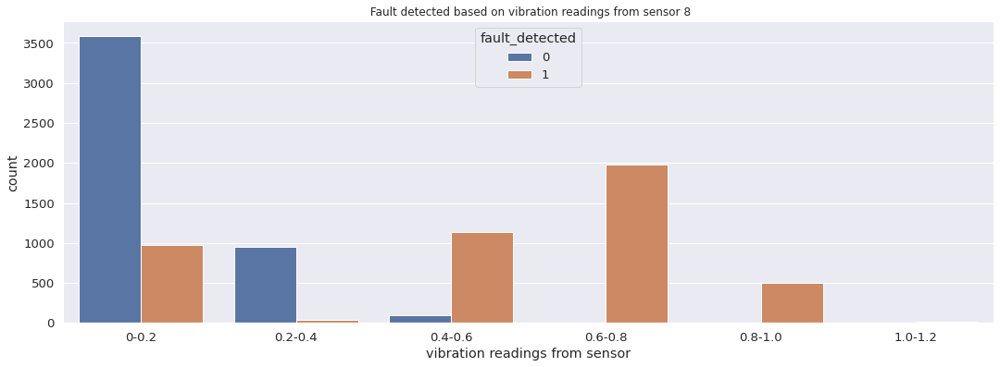

In [0]:
#Let's visualise for some other sensors. We can choose sensor 8
bins = [0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2]
labels =['0-0.2', '0.2-0.4', '0.4-0.6', '0.6-0.8', '0.8-1.0', '1.0-1.2']

df['binned'] = pd.cut(df['8'], bins=bins, labels =labels)
plt.figure(figsize=(18,6))
sns.countplot(x='binned',hue='fault_detected',  data = df)
plt.title(" Fault detected based on vibration readings from sensor 8", fontsize = 12)
plt.xlabel('vibration readings from sensor')

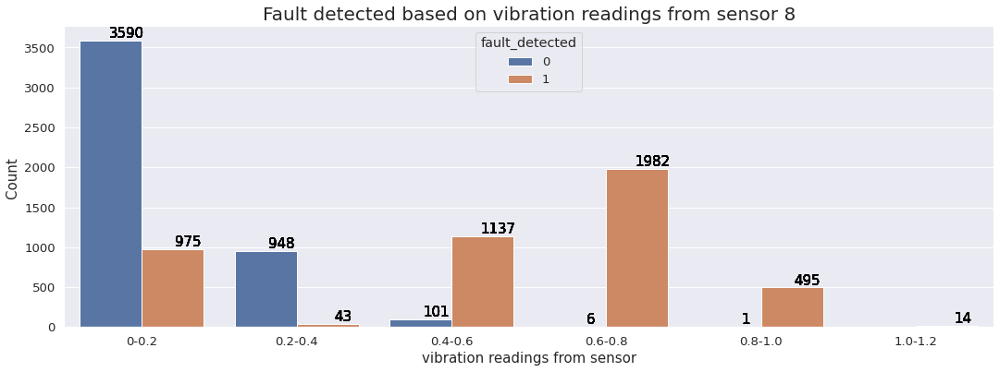

In [0]:
plt.figure(figsize=(18,6))
sns.set(font_scale=1.2)
ax=sns.countplot(x='binned',hue='fault_detected',  data = df)
ax.set_title('Fault detected based on vibration readings from sensor 8' , fontsize = 20)
plt.xlabel('vibration readings from sensor', fontsize=15)
plt.ylabel('Count ', fontsize=15)
plt.xticks(rotation='horizontal')
for p in ax.patches:
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'),
                    (p.get_x()+0.3, p.get_height()), ha='center', va='bottom', color='black', size=15)

Out[26]: Text(0.5, 0, 'vibration readings from sensor 8')

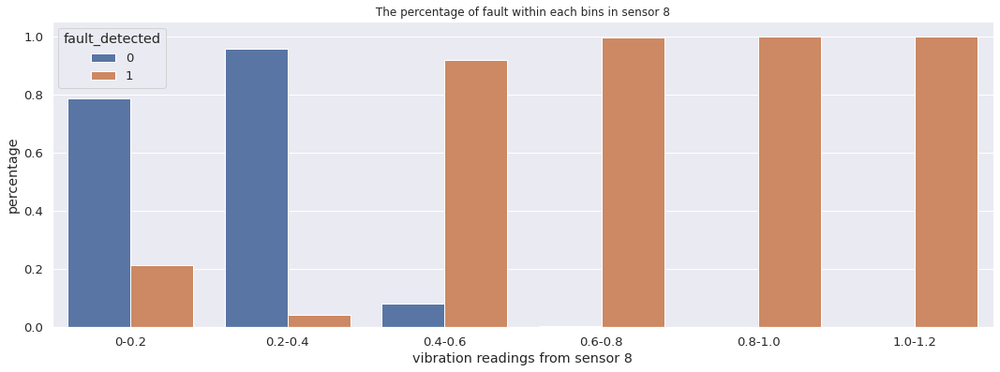

In [0]:
# The percentage of fault within each bins
#bins = [0, 0.25, 0.5, 0.75, 1.0, 1.25]
#labels =['0-0.25', '0.25-0.50', '0.50-0.75', '0.75-1.0', '1.0-1.25']
bins = [0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2]
labels =['0-0.2', '0.2-0.4', '0.4-0.6', '0.6-0.8', '0.8-1.0', '1.0-1.2']
df['binned'] = pd.cut(df['8'], bins=bins, labels =labels)
# group by binned and calculate percentage of each fault_detected
grouped = df.groupby('binned')['fault_detected'].value_counts(normalize=True).reset_index(name='percentage')

plt.figure(figsize=(18,6))
sns.barplot(x='binned',y ='percentage', hue='fault_detected',  data = grouped)
plt.title(" The percentage of fault within each bins in sensor 8 ", fontsize = 12)
plt.xlabel('vibration readings from sensor 8')


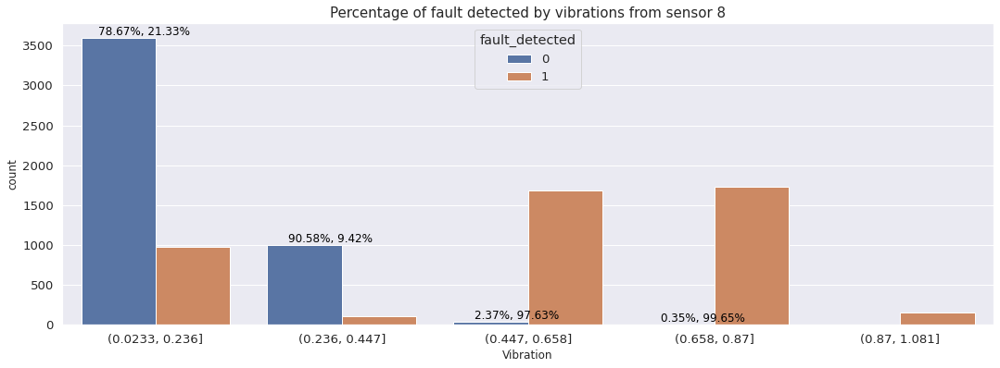

In [0]:
# Cut vibration readings inti bin and show the percenatge of fault detected within each bin
bin_sen_8 = pd.cut(df['8'], bins=5, ordered=True)
sen8_labels = [f'({interval.left}, {interval.right}]' for interval in bin_sen_8.cat.categories]
df['bins_sen_8'] = bin_sen_8.cat.rename_categories(sen8_labels )

# Create countplot
plt.figure(figsize=(18, 6))
sns.set(font_scale=1.2)
ax = sns.countplot(x='bins_sen_8',hue='fault_detected', data= df)
ax.set_title('Percentage of fault detected by vibrations from sensor 8', fontsize=15)
plt.xlabel('Vibration', fontsize=12)
plt.ylabel('count', fontsize=12)
plt.xticks(rotation='horizontal')

# Annotate plot with percentages
total_counts = df.groupby('bins_sen_8')['fault_detected'].count().reset_index(name='count')
fault_counts = df.groupby(['bins_sen_8', 'fault_detected']).size().reset_index(name='fault_count')

for p, label in zip(ax.patches, ax.get_xticklabels()):
    height = p.get_height()
    bin_label = label.get_text()
    bin_counts = fault_counts[fault_counts['bins_sen_8'] == bin_label]['fault_count']
    total_count = total_counts[total_counts['bins_sen_8'] == bin_label]['count'].iloc[0]
    percentages = [count / total_count * 100 for count in bin_counts]
    percentage_str = ', '.join([f'{percentage:.2f}%' for percentage in percentages])
    ax.annotate(percentage_str, (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom', color='black', size=12,
                xytext=(28, 0), textcoords='offset points') 

plt.show()

Out[28]: Text(0.5, 0, 'vibration readings from sensor')

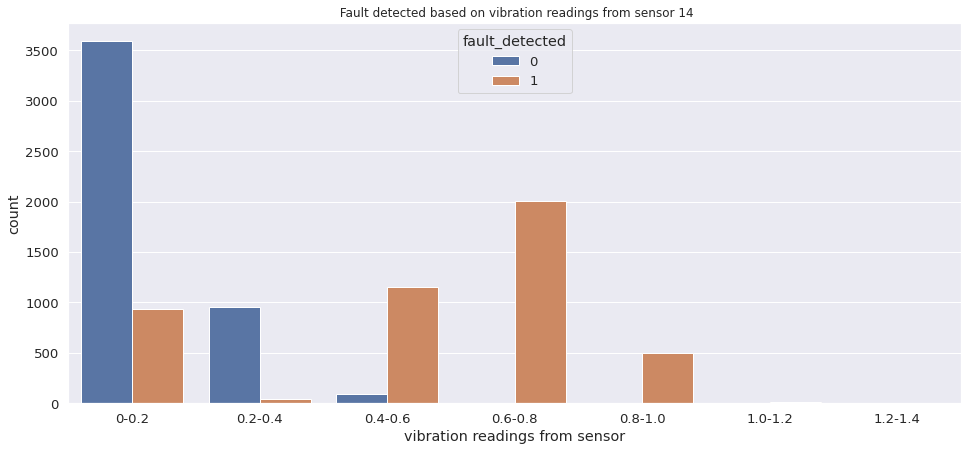

In [0]:
bins = [0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4]
labels =['0-0.2', '0.2-0.4', '0.4-0.6', '0.6-0.8', '0.8-1.0', '1.0-1.2', '1.2-1.4']
df['binned_14'] = pd.cut(df['14'], bins=bins, labels =labels)
plt.figure(figsize=(16,7))
sns.countplot(x='binned_14',hue='fault_detected',  data = df)
plt.title(" Fault detected based on vibration readings from sensor 14", fontsize = 12)
plt.xlabel('vibration readings from sensor')

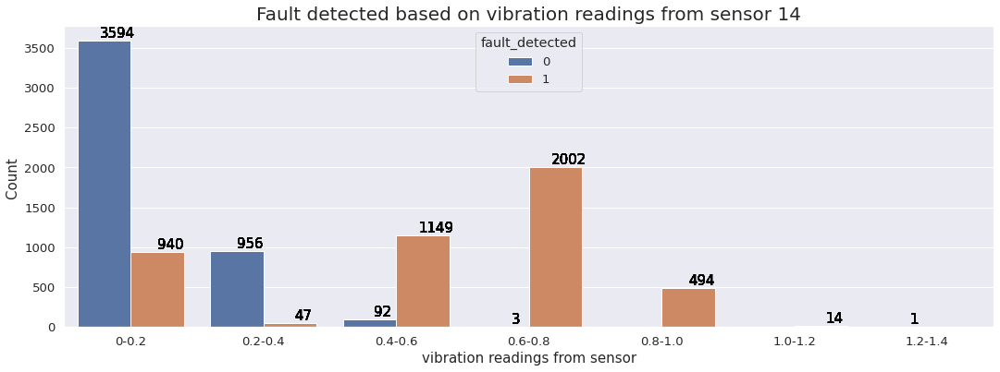

In [0]:
plt.figure(figsize=(18,6))
sns.set(font_scale=1.2)
ax=sns.countplot(x='binned_14',hue='fault_detected',  data = df)
ax.set_title('Fault detected based on vibration readings from sensor 14' , fontsize = 20)
plt.xlabel('vibration readings from sensor', fontsize=15)
plt.ylabel('Count ', fontsize=15)
plt.xticks(rotation='horizontal')
for p in ax.patches:
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'),
                    (p.get_x()+0.3, p.get_height()), ha='center', va='bottom', color='black', size=15)

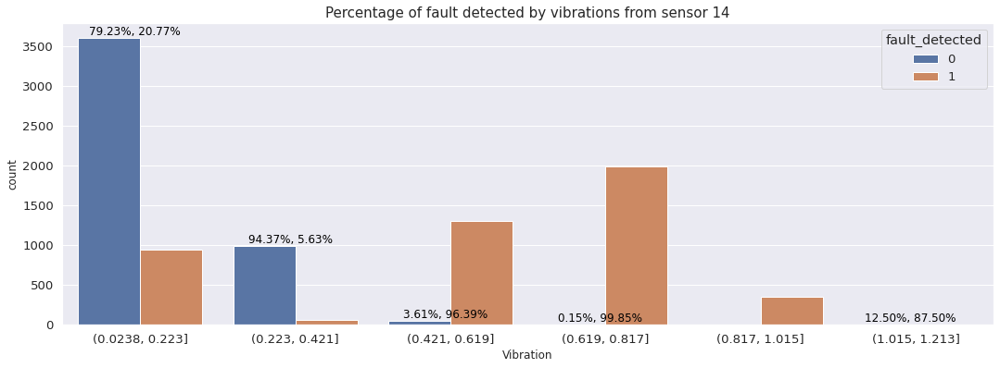

In [0]:
# Cut vibration readings inti bin and show the percenatge of fault detected within each bin
bin_sen_14 = pd.cut(df['14'], bins=6, ordered=True)
sen14_labels = [f'({interval.left}, {interval.right}]' for interval in bin_sen_14.cat.categories]
df['bins_sen_14'] = bin_sen_14.cat.rename_categories(sen14_labels )

# Create countplot
plt.figure(figsize=(18, 6))
sns.set(font_scale=1.2)
ax = sns.countplot(x='bins_sen_14',hue='fault_detected', data= df)
ax.set_title('Percentage of fault detected by vibrations from sensor 14', fontsize=15)
plt.xlabel('Vibration', fontsize=12)
plt.ylabel('count', fontsize=12)
plt.xticks(rotation='horizontal')

# Annotate plot with percentages
total_counts = df.groupby('bins_sen_14')['fault_detected'].count().reset_index(name='count')
fault_counts = df.groupby(['bins_sen_14', 'fault_detected']).size().reset_index(name='fault_count')

for p, label in zip(ax.patches, ax.get_xticklabels()):
    height = p.get_height()
    bin_label = label.get_text()
    bin_counts = fault_counts[fault_counts['bins_sen_14'] == bin_label]['fault_count']
    total_count = total_counts[total_counts['bins_sen_14'] == bin_label]['count'].iloc[0]
    percentages = [count / total_count * 100 for count in bin_counts]
    percentage_str = ', '.join([f'{percentage:.2f}%' for percentage in percentages])
    ax.annotate(percentage_str, (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom', color='black', size=12,
                xytext=(28, 0), textcoords='offset points') 

plt.show()

Out[31]: Text(0.5, 1.0, 'Count of the outcome of detection')

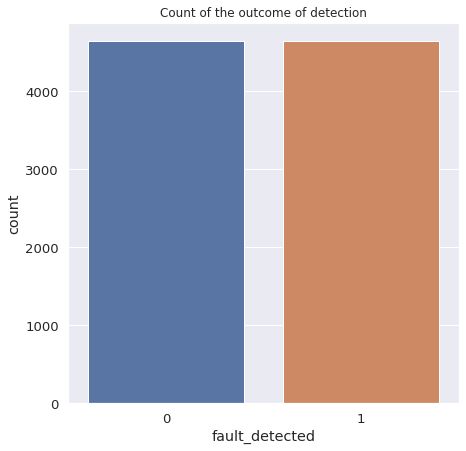

In [0]:
plt.figure(figsize=(7,7))
sns.countplot(x='fault_detected', data = df2)
plt.title('Count of the outcome of detection', fontsize = 12)


In [0]:
#To check if their are duplicated values
#set(FaultPandasFrame.duplicated())

Out[33]: Text(0.5, 1.0, 'fault detection from sensor 1')

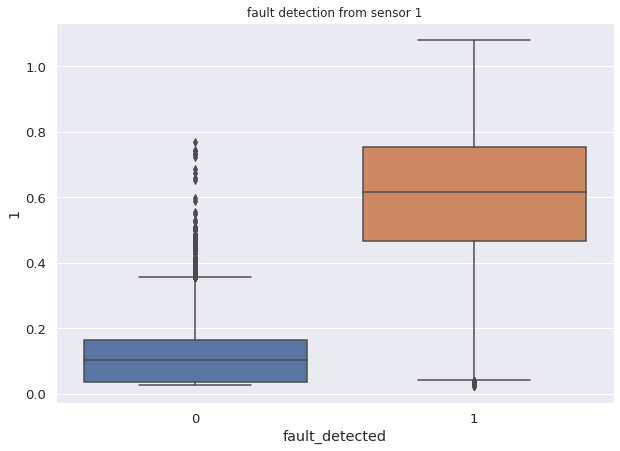

In [0]:
# A box plot to show the outcome of fault detection based on the readings for each sensor
# Readings from few sensors were checked: sensor 1, sensor 8 and sensor 14
plt.figure(figsize=(10,7))
sns.boxplot(y='1', x='fault_detected', data=df2)
plt.title('fault detection from sensor 1', fontsize = 12)

Out[34]: Text(0.5, 1.0, 'fault detection from sensor 8')

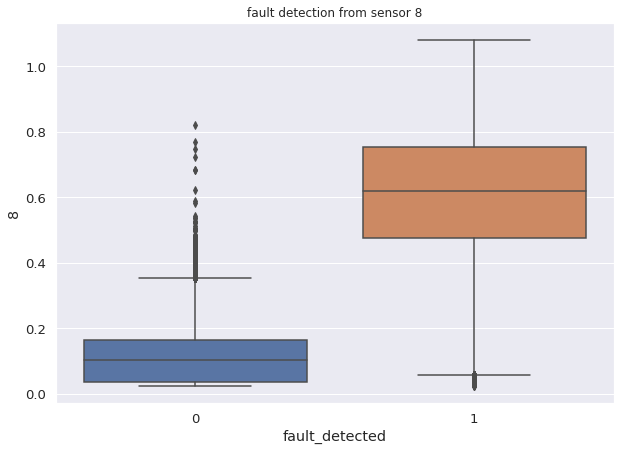

In [0]:
plt.figure(figsize=(10,7))
sns.boxplot(y='8', x='fault_detected', data=df2)
plt.title('fault detection from sensor 8', fontsize = 12)

Out[35]: Text(0.5, 1.0, 'fault detection from sensor 14')

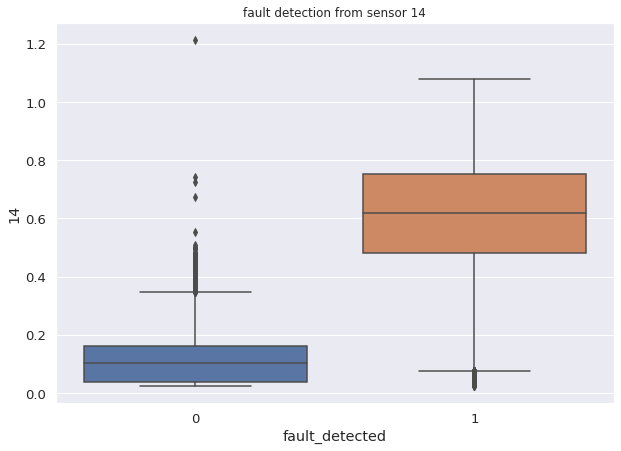

In [0]:
plt.figure(figsize=(10,7))
sns.boxplot(y='14', x='fault_detected', data=df2)
plt.title('fault detection from sensor 14', fontsize = 12)

In [0]:
# Using the DataFrame created intiallly for further EDA
FaultsDF.printSchema()

root
 |-- 1: double (nullable = true)
 |-- 2: double (nullable = true)
 |-- 3: double (nullable = true)
 |-- 4: double (nullable = true)
 |-- 5: double (nullable = true)
 |-- 6: double (nullable = true)
 |-- 7: double (nullable = true)
 |-- 8: double (nullable = true)
 |-- 9: double (nullable = true)
 |-- 10: double (nullable = true)
 |-- 11: double (nullable = true)
 |-- 12: double (nullable = true)
 |-- 13: double (nullable = true)
 |-- 14: double (nullable = true)
 |-- 15: double (nullable = true)
 |-- 16: double (nullable = true)
 |-- 17: double (nullable = true)
 |-- 18: double (nullable = true)
 |-- 19: double (nullable = true)
 |-- 20: double (nullable = true)
 |-- fault_detected: integer (nullable = true)



In [0]:
FaultsDF.describe().display()

summary,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected
count,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292
mean,0.34162330499354226,0.34263116121394677,0.3421213812957383,0.34213907124407966,0.3428434405940584,0.3428279366659492,0.3427147008179088,0.34306577566724017,0.34317299155187225,0.3439251842983209,0.3441075320167876,0.34398424047567727,0.3441183275936292,0.3448787599547991,0.34489994753551373,0.3458342525828662,0.34563488753766686,0.3457525290572536,0.3465221427034015,0.346670724817048,0.5
stddev,0.28919489486260785,0.2890875372793958,0.28916422490616933,0.28916356333107296,0.2889646554403878,0.2890889899729543,0.2891948159883224,0.28919185608065456,0.2893401858067147,0.289011538534877,0.28920014487495876,0.2890708129465896,0.28911804701463106,0.2889821392646809,0.2891314011350137,0.2888285654988746,0.28892040336707314,0.28915028148431343,0.2887705775702368,0.28900135543931055,0.5000269070362092
min,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.025,0.025,0.025,0.024375,0.024375,0.024375,0.024375,0.025,0
max,1.0809375,1.2134375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.2134375,1.0809375,1.2134375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1


In [0]:
# Let's also see the distribution of the result from the fault detected if the class is balance or not
# here the count funstion will be imported so that we can use it to count to outcome of each class of result
from pyspark.sql.functions import count as _count

In [0]:
# To check Class balance
FaultsDF.groupBy("fault_detected").agg(_count("*")).display()

fault_detected,count(1)
1,4646
0,4646


In [0]:

# Importing some functions to help with further EDA
from pyspark.sql.functions import isnan, when, count, col


In [0]:
# Checking if there are missing values in each column
FaultsDF.select([_count(when(isnan(c), c)).alias(c) for c in FaultsDF.columns]).display()

1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
# Checking if there are missing values in each column
FaultsDF.select([_count(when(isnan(c), c)).alias(c) for c in FaultsDF.columns]).show()

+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+--------------+
|  1|  2|  3|  4|  5|  6|  7|  8|  9| 10| 11| 12| 13| 14| 15| 16| 17| 18| 19| 20|fault_detected|
+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+--------------+
|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|             0|
+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+--------------+



In [0]:

duplicates_ = FaultsDF.groupBy(FaultsDF.columns).count().filter(col("count") > 1)
print("Duplicates based on all columns:")
duplicates_.display()

Duplicates based on all columns:


1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected,count
0.035625,0.0359375,0.0315625,0.035625,0.0365625,0.03625,0.040625,0.0409375,0.0421875,0.0375,0.0365625,0.11875,0.1846875,0.131875,0.130625,0.1325,0.201875,0.3871875,0.1328125,0.14,0,2
0.09875,0.09875,0.0978125,0.1028125,0.1003125,0.09625,0.1015625,0.10125,0.096875,0.0978125,0.1021875,0.0978125,0.096875,0.1003125,0.0990625,0.09875,0.0940625,0.096875,0.103125,0.0965625,0,2
0.0346875,0.036875,0.0353125,0.03875,0.0334375,0.0359375,0.0390625,0.0334375,0.03625,0.035625,0.033125,0.0359375,0.0359375,0.0325,0.0321875,0.0365625,0.034375,0.0328125,0.03,0.03625,0,2
0.10625,0.10625,0.1021875,0.0971875,0.101875,0.1065625,0.1040625,0.101875,0.104375,0.1109375,0.105,0.100625,0.10375,0.105,0.111875,0.1096875,0.0965625,0.1,0.101875,0.1025,0,2
0.1009375,0.1040625,0.101875,0.1078125,0.10875,0.1059375,0.1096875,0.111875,0.110625,0.11125,0.1075,0.1203125,0.1115625,0.1178125,0.115625,0.1215625,0.1215625,0.1159375,0.1165625,0.119375,0,2
0.035625,0.0334375,0.034375,0.03875,0.03875,0.0359375,0.03375,0.0346875,0.0375,0.034375,0.0334375,0.0321875,0.035625,0.0359375,0.03625,0.035,0.0334375,0.0334375,0.03125,0.0346875,0,2
0.4028125,0.3915625,0.3915625,0.384375,0.3859375,0.3871875,0.3975,0.398125,0.3896875,0.3865625,0.3890625,0.38125,0.3865625,0.3859375,0.3825,0.395625,0.3803125,0.3984375,0.3934375,0.3971875,0,2
0.36,0.3653125,0.3475,0.3534375,0.3609375,0.3659375,0.09125,0.340625,0.35125,0.3515625,0.3546875,0.356875,0.3446875,0.3453125,0.3515625,0.3453125,0.34875,0.3509375,0.3571875,0.349375,0,2
0.14875,0.38375,0.3884375,0.380625,0.390625,0.38875,0.3975,0.3878125,0.3903125,0.395625,0.3871875,0.3796875,0.385625,0.3925,0.3953125,0.3915625,0.38625,0.3825,0.3865625,0.39625,0,2
0.0365625,0.0325,0.0378125,0.0315625,0.0334375,0.0365625,0.0375,0.03625,0.0396875,0.0403125,0.0359375,0.0434375,0.035625,0.033125,0.034375,0.0409375,0.040625,0.0359375,0.03625,0.0334375,0,2


In [0]:
# To confirm the number of rows and the distinct number of rows so we can identify if there is duplicated rows and see how many they are
row_count = FaultsDF.count()
distinct_count = FaultsDF.distinct().count()
print(row_count)
print(distinct_count)


9292
8968


In [0]:
print(row_count - distinct_count)

324


In [0]:
# To remove duplicated rows and keep only distinct rows

FaultsDF_drop = FaultsDF.distinct()

In [0]:
# To confirm that we now have 8968 rows since we have dropped the duplicated rows
FaultsDF_drop_count = FaultsDF_drop.distinct().count()
FaultsDF_drop_count

Out[47]: 8968

In [0]:
FaultsDF_drop.display()

1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected
0.3634375,0.3665625,0.370625,0.369375,0.368125,0.3678125,0.3803125,0.37625,0.3809375,0.3815625,0.3928125,0.3834375,0.36625,0.379375,0.3684375,0.3728125,0.36625,0.379375,0.37375,0.376875,0
0.03875,0.03,0.0321875,0.0396875,0.0384375,0.031875,0.0384375,0.0384375,0.034375,0.035,0.0371875,0.0315625,0.0328125,0.031875,0.0325,0.03875,0.0365625,0.0378125,0.035,0.0353125,0
0.1428125,0.1459375,0.1346875,0.1315625,0.130625,0.1346875,0.155,0.12625,0.1765625,0.1403125,0.1434375,0.139375,0.139375,0.13375,0.1425,0.1375,0.12875,0.131875,0.130625,0.1353125,0
0.033125,0.025,0.0303125,0.026875,0.033125,0.0328125,0.025,0.0290625,0.0328125,0.0340625,0.03,0.0325,0.0346875,0.03125,0.02875,0.031875,0.0259375,0.033125,0.03,0.026875,0
0.03375,0.0390625,0.03125,0.0390625,0.0384375,0.0390625,0.0325,0.03875,0.03625,0.0403125,0.031875,0.036875,0.0328125,0.0384375,0.036875,0.0325,0.0346875,0.033125,0.0340625,0.0325,0
0.0328125,0.0340625,0.031875,0.03625,0.0378125,0.038125,0.0359375,0.035625,0.034375,0.033125,0.0384375,0.04,0.034375,0.036875,0.0378125,0.0325,0.033125,0.034375,0.0353125,0.0328125,0
0.033125,0.0378125,0.0340625,0.03875,0.0325,0.0325,0.035,0.03375,0.03125,0.0346875,0.0325,0.0340625,0.03875,0.031875,0.035625,0.03375,0.03,0.030625,0.0378125,0.0340625,0
0.03875,0.0303125,0.0365625,0.0334375,0.0359375,0.0321875,0.038125,0.035625,0.0378125,0.035625,0.0325,0.0359375,0.0309375,0.03875,0.0340625,0.0359375,0.0296875,0.04,0.039375,0.034375,0
0.1459375,0.1459375,0.1578125,0.145625,0.1465625,0.1484375,0.14375,0.14625,0.14875,0.148125,0.141875,0.1575,0.1409375,0.148125,0.1496875,0.14625,0.1525,0.1553125,0.1534375,0.144375,0
0.0390625,0.03875,0.041875,0.038125,0.0375,0.0384375,0.0384375,0.036875,0.0421875,0.0425,0.035,0.038125,0.0384375,0.0371875,0.13625,0.144375,0.143125,0.13625,0.1225,0.14125,0


In [0]:

FaultsDF_drop.describe().display()

summary,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected
count,8968,8968,8968,8968,8968,8968,8968,8968,8968,8968,8968,8968,8968,8968,8968,8968,8968,8968,8968,8968,8968
mean,0.3487404870093662,0.3496980932203395,0.34913992807760935,0.3491733455062442,0.3500254028211428,0.34986911797502146,0.3499042428635157,0.35030448539250597,0.3504487483273867,0.3512348070918825,0.3512509059991078,0.35122205341213175,0.35138847847903576,0.35224569301962677,0.3523516949152534,0.35317420272078526,0.352932753958518,0.3530614406779665,0.35394625334522617,0.3540821880575384,0.518064228367529
stddev,0.29091106336065264,0.2907930998830016,0.29090468940487874,0.29089397507061654,0.2906356318628472,0.2908059573824165,0.2908626715505739,0.2908400689195194,0.2910043497583045,0.29064261615896214,0.2907612008772809,0.29074394223052435,0.29076562799975963,0.290574275194039,0.2906973101283303,0.2904268339843629,0.2905374506629908,0.29077639851041953,0.29032827360765895,0.2905543397203239,0.4997014381279512
min,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.025,0.025,0.025,0.024375,0.024375,0.024375,0.024375,0.025,0
max,1.0809375,1.2134375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.2134375,1.0809375,1.2134375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1


In [0]:
from pyspark.ml.feature import RFormula
Process = RFormula(formula= "fault_detected ~ .")
FaultDF = Process.fit(FaultsDF_drop).transform(FaultsDF_drop)
FaultDF.show(10)

2023/05/29 12:47:09 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '59347b1de50248eab25fecf85513b4a4', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+
|        1|        2|        3|        4|        5|        6|        7|        8|        9|       10|       11|       12|       13|       14|       15|       16|       17|       18|       19|       20|fault_detected|            features|label|
+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+
|0.3

In [0]:

#FaultDF.display(10)

In [0]:
# To split the data into training and testing data

(trainingDF, testingDF) = FaultDF.randomSplit([0.75, 0.25], seed =50)

In [0]:
# Training the model
# Using DecisionTreeClassifier
from pyspark.ml.classification import DecisionTreeClassifier
dt = DecisionTreeClassifier(labelCol="label", featuresCol="features")
model = dt.fit(trainingDF)

2023/05/29 12:47:11 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '4e74d60dd047452c9a348bbadf204f86', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/05/29 12:48:25 WARNING mlflow.pyspark.ml: Model inputs contain unsupported Spark data types: [StructField('features', VectorUDT(), True)]. Model signature is not logged.
2023/05/29 12:48:29 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/05/29 12:49:28 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/databricks/python/lib/python3.9/site-packages/_distutils_hack/__init__.py:30: UserWarning: Setuptools is replacing distutils."


In [0]:
# To make predictions with the trained model
predictions = model.transform(testingDF)
predictions.show()

+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+--------------+--------------------+----------+
|        1|        2|        3|        4|        5|        6|        7|        8|        9|       10|       11|       12|       13|       14|       15|       16|       17|       18|       19|       20|fault_detected|            features|label| rawPrediction|         probability|prediction|
+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+--------------+--------------------+----------+
|  0.02625| 0.025625|0.0290625|0.0265625|0.0353125|0.0259375|0.0328125|0.0340625|  0.03375|0.0309375|0.0309375| 0.034375| 0.030

In [0]:
predictions.show(2)

+---------+---------+---------+---------+---------+---------+---------+---------+-------+---------+---------+---------+---------+---------+---------+--------+---------+---------+-------+---------+--------------+--------------------+-----+--------------+--------------------+----------+
|        1|        2|        3|        4|        5|        6|        7|        8|      9|       10|       11|       12|       13|       14|       15|      16|       17|       18|     19|       20|fault_detected|            features|label| rawPrediction|         probability|prediction|
+---------+---------+---------+---------+---------+---------+---------+---------+-------+---------+---------+---------+---------+---------+---------+--------+---------+---------+-------+---------+--------------+--------------------+-----+--------------+--------------------+----------+
|  0.02625| 0.025625|0.0290625|0.0265625|0.0353125|0.0259375|0.0328125|0.0340625|0.03375|0.0309375|0.0309375| 0.034375| 0.030625| 0.029375| 0.

In [0]:
predictions.display()

1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected,features,label,rawPrediction,probability,prediction
0.02625,0.025625,0.0290625,0.0265625,0.0353125,0.0259375,0.0328125,0.0340625,0.03375,0.0309375,0.0309375,0.034375,0.030625,0.029375,0.029375,0.026875,0.030625,0.0284375,0.03125,0.0271875,0,"Map(vectorType -> dense, length -> 20, values -> List(0.02625, 0.025625, 0.0290625, 0.0265625, 0.0353125, 0.0259375, 0.0328125, 0.0340625, 0.03375, 0.0309375, 0.0309375, 0.034375, 0.030625, 0.029375, 0.029375, 0.026875, 0.030625, 0.0284375, 0.03125, 0.0271875))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(3151.0, 149.0))","Map(vectorType -> dense, length -> 2, values -> List(0.9548484848484848, 0.04515151515151515))",0.0
0.0265625,0.0284375,0.02625,0.0325,0.0296875,0.0353125,0.0328125,0.0265625,0.03125,0.0328125,0.029375,0.0284375,0.0334375,0.0321875,0.0296875,0.0325,0.0284375,0.0259375,0.03125,0.02875,1,"Map(vectorType -> dense, length -> 20, values -> List(0.0265625, 0.0284375, 0.02625, 0.0325, 0.0296875, 0.0353125, 0.0328125, 0.0265625, 0.03125, 0.0328125, 0.029375, 0.0284375, 0.0334375, 0.0321875, 0.0296875, 0.0325, 0.0284375, 0.0259375, 0.03125, 0.02875))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(3151.0, 149.0))","Map(vectorType -> dense, length -> 2, values -> List(0.9548484848484848, 0.04515151515151515))",0.0
0.026875,0.0346875,0.03125,0.0303125,0.0315625,0.02875,0.0278125,0.034375,0.0325,0.0375,0.030625,0.03625,0.0334375,0.0346875,0.0284375,0.0290625,0.0296875,0.031875,0.0315625,0.0315625,0,"Map(vectorType -> dense, length -> 20, values -> List(0.026875, 0.0346875, 0.03125, 0.0303125, 0.0315625, 0.02875, 0.0278125, 0.034375, 0.0325, 0.0375, 0.030625, 0.03625, 0.0334375, 0.0346875, 0.0284375, 0.0290625, 0.0296875, 0.031875, 0.0315625, 0.0315625))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(3151.0, 149.0))","Map(vectorType -> dense, length -> 2, values -> List(0.9548484848484848, 0.04515151515151515))",0.0
0.0278125,0.0275,0.02875,0.035,0.029375,0.0284375,0.028125,0.0340625,0.030625,0.0315625,0.0265625,0.0253125,0.0259375,0.0284375,0.0296875,0.0340625,0.0328125,0.0328125,0.0325,0.025,1,"Map(vectorType -> dense, length -> 20, values -> List(0.0278125, 0.0275, 0.02875, 0.035, 0.029375, 0.0284375, 0.028125, 0.0340625, 0.030625, 0.0315625, 0.0265625, 0.0253125, 0.0259375, 0.0284375, 0.0296875, 0.0340625, 0.0328125, 0.0328125, 0.0325, 0.025))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(3151.0, 149.0))","Map(vectorType -> dense, length -> 2, values -> List(0.9548484848484848, 0.04515151515151515))",0.0
0.0278125,0.0284375,0.0271875,0.0284375,0.0309375,0.0309375,0.02875,0.0340625,0.0296875,0.03125,0.0359375,0.671875,0.0640625,0.07,0.0603125,0.0778125,0.0984375,0.07875,0.0815625,0.0715625,1,"Map(vectorType -> dense, length -> 20, values -> List(0.0278125, 0.0284375, 0.0271875, 0.0284375, 0.0309375, 0.0309375, 0.02875, 0.0340625, 0.0296875, 0.03125, 0.0359375, 0.671875, 0.0640625, 0.07, 0.0603125, 0.0778125, 0.0984375, 0.07875, 0.0815625, 0.0715625))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(3151.0, 149.0))","Map(vectorType -> dense, length -> 2, values -> List(0.9548484848484848, 0.04515151515151515))",0.0
0.0278125,0.03,0.0284375,0.029375,0.02875,0.03125,0.0325,0.0290625,0.02625,0.033125,0.031875,0.0328125,0.030625,0.03125,0.0296875,0.02875,0.0328125,0.0328125,0.0303125,0.0321875,0,"Map(vectorType -> dense, length -> 20, values -> List(0.0278125, 0.03, 0.0284375, 0.029375, 0.02875, 0.03125, 0.0325, 0.0290625, 0.02625, 0.033125, 0.031875, 0.0328125, 0.030625, 0.03125, 0.0296875, 0.02875, 0.0328125, 0.0328125, 0.0303125, 0.0321875))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(3151.0, 149.0))","Map(vectorType -> dense, length -> 2, values -> List(0.9548484848484848, 0.04515151515151515))",0.0
0.0278125,0.038125,0.036875,0.1553125,0.1696875,0.1809375,0.189375,0.176875,0.1646875,0.1775,0.1703125,0.1690625,0.1703125,0.1778125,0.1653125,0.0

In [0]:
# To evaluate the accuracy of predictiosn made by the model, we can use the multiclass classificationevaluator
from pyspark.ml.evaluation import  MulticlassClassificationEvaluator
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(predictions)
print("Accuracy score: %g " %(accuracy))


Accuracy score: 0.968071 


In [0]:
# Using MLflow to track experiment

In [0]:
from pyspark.ml.tuning import ParamGridBuilder, TrainValidationSplit
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.sql.functions import col


# start an MLflow run and giving it a name for easy identification in the logs
with mlflow.start_run(run_name="decision_tree_classification") as run:

    # create an instance of  decision tree classifier
    dt = DecisionTreeClassifier(featuresCol="features", labelCol="label")

    # creating a parameter grid of  different values
    paramGrid = (ParamGridBuilder()
                 .addGrid(dt.maxDepth, [7,9 ])
                 .addGrid(dt.maxBins, [12,32])
                 .addGrid(dt.impurity, ['gini', 'entropy'])
                 .build())

    # creating a TrainValidationSplit object
    tvs = TrainValidationSplit(estimator=dt,
                               estimatorParamMaps=paramGrid,
                               evaluator=MulticlassClassificationEvaluator()
                             )
    # fit the model 
    model = tvs.fit(trainingDF)
    
    # retrieving a dictionary of the hyperparameters and values of the best model
    best_parameters = model.bestModel.extractParamMap()
    # log the best model parameters
    for param, value in best_parameters.items():

        with mlflow.start_run(nested=True):
            mlflow.log_param("depth", 7)
        with mlflow.start_run(nested=True):
            mlflow.log_param("depth", 9)
            
    # The best trained  model 
    best_model_1=model.bestModel
   
    # using the best model on the testing data and evaluating the accuracy
  
    evaluator = MulticlassClassificationEvaluator(labelCol="label",
                                                  predictionCol="prediction",
                                                  metricName="accuracy")
    accuracy_1 = evaluator.evaluate(best_model_1.transform(testingDF))

    # log the accuracy of the best model
    mlflow.log_metric("accuracy", accuracy_1)

    # end the MLflow run
    mlflow.end_run()

2023/05/29 13:10:07 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/05/29 13:11:19 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [0]:
print(accuracy_1)

0.9818181818181818


In [0]:
# To get the best parameters
print("Tuned parameters for the best model: ")
print("MaxDepth: %g" %best_model_1.getMaxDepth())
print("MaxBins: %g" %best_model_1.getMaxBins())
print("Impurity: %s" %best_model_1.getImpurity())

Tuned parameters for the best model: 
MaxDepth: 9
MaxBins: 32
Impurity: entropy


In [0]:
# RandomForest Classifier

In [0]:
# Splitting data for  RandomForest classification models
(trainingDF2, testingDF2) = FaultDF.randomSplit([0.75, 0.25], seed =20)

In [0]:
from pyspark.ml.classification import RandomForestClassifier

In [0]:
# creating an instance of  random forest classifier and fitting it into the training data
rf = RandomForestClassifier(labelCol="label", featuresCol="features")
model2=rf.fit(trainingDF2)

2023/05/29 13:12:35 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '35931319b9124ed586990c5576539974', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/05/29 13:14:38 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [0]:
# Making predictions with the Random Forest classifer model
predictions2 = model2.transform(testingDF2)
predictions2.show()

+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+--------------------+--------------------+----------+
|        1|        2|        3|        4|        5|        6|        7|        8|        9|       10|       11|       12|       13|       14|       15|       16|       17|       18|       19|       20|fault_detected|            features|label|       rawPrediction|         probability|prediction|
+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+--------------------+--------------------+----------+
|0.0253125|0.0259375|0.0284375|0.0296875|0.0340625|0.0328125|0.0328125|   0.0325|    0.025|0.0334375| 0.03562

In [0]:
#predictions2.display()


In [0]:
# Evaluating accuracy of the randomForestClassifier without hyperparameter tuning
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracyRF = evaluator.evaluate(predictions2)
print("Accuracy score: ", accuracyRF)

Accuracy score:  0.9777979157227005


In [0]:
# Random Forest classifier model using several hyperparameters and getting the best model
with mlflow.start_run(run_name="random_forest_classification") as run:

    # create an instance of Random Forest classifier
    rf = RandomForestClassifier(labelCol="label", featuresCol="features")

    # parameter grid with different values
    RFParamGrid = (ParamGridBuilder()
                 .addGrid(rf.numTrees, [10,15 ])
                 .addGrid(rf.maxDepth, [9,13])
                 .build())

    # create a TrainValidationSplit object
    RFtvs = TrainValidationSplit(estimator=rf,
                               estimatorParamMaps=RFParamGrid,
                               evaluator=MulticlassClassificationEvaluator()
                            )

    # fit the model and retrieve the best model
    model = RFtvs.fit(trainingDF2)
    
    # retrieving a dictionary of hyperparameters and values of the best model
    best_parameters = model.bestModel.extractParamMap()
    # log the best model parameters
    for param, value in best_parameters.items():

        with mlflow.start_run(nested=True):
            mlflow.log_param("depth", 9)
        with mlflow.start_run(nested=True):
            mlflow.log_param("depth", 13)
           
    
     # The best trained  model 
    best_model_2 =model.bestModel

    # using the best model on the testing data
   
    evaluator = MulticlassClassificationEvaluator(labelCol="label",
                                                  predictionCol="prediction",
                                                  metricName="accuracy")
    accuracy_2 = evaluator.evaluate(best_model_2.transform(testingDF2))

    # log the accuracy of the best model
    mlflow.log_metric("accuracy", accuracy_2)

    # end the MLflow run
    mlflow.end_run()

2023/05/29 13:41:23 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/05/29 13:42:36 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [0]:
# Accuracy using the best model
print(accuracy_2)

0.9841413683733575


In [0]:
# Parameters of best model from Random forest classifier
print("Tuned parameters for the best model: ")
print("MaxDepth: ", best_model_2.getMaxDepth())
print("numTrees: ", best_model_2.getNumTrees)


Tuned parameters for the best model: 
MaxDepth:  9
numTrees:  15


In [0]:
# importing logisticRegression classifier
#from pyspark.ml.classification import LogisticRegression
